In [33]:
import pandas as pd 
import numpy as np 
df = pd.read_csv('preprocessed_data.csv')
df

,Psn_account,avg_session_length,preferred_session_time,total_days_active,peak_rank,peak_rank_category,avg_score,dlc_count,mode_diversity,session_time_Day,session_time_Evening,session_time_Night
0,Player1002792,31.376668,Night,4,14.0,Beginner,35173.933333,0.0,3,False,False,True
1,Player1004812,18.945651,Evening,11,26.0,Advanced,108870.915493,1.0,3,False,True,False
2,Player1011209,26.842306,Night,24,34.0,Hardcore,701022.148148,0.0,3,False,False,True
3,Player1013406,40.824307,Evening,16,25.0,Advanced,179928.407767,2.0,3,False,True,False
4,Player1013538,22.522221,Evening,8,22.0,Advanced,91253.054054,0.0,3,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...
990,Player990988,167.766655,Night,1,10.0,Beginner,16693.500000,0.0,1,False,False,True
991,Player991184,19.525334,Evening,22,38.0,Hardcore,881738.003175,1.0,3,False,True,False
992,Player993746,19.028569,Evening,3,16.0,Advanced,48468.692308,0.0,3,False,True,False
993,Player994675,29.616665,Evening,1,2.0,Beginner,1148.750000,0.0,1,False,True,False


In [34]:
#drop misisng data 
df = df.dropna()

In [35]:
missing_values_sum = df.isna().sum()
total_rows = df.shape[0]
missing_values_percentage = (missing_values_sum / total_rows) * 100
# print(missing_values_percentage.head(50))

In [36]:
#Models 
df.columns

Index(['Psn_account', 'avg_session_length', 'preferred_session_time',
       'total_days_active', 'peak_rank', 'peak_rank_category', 'avg_score',
       'dlc_count', 'mode_diversity', 'session_time_Day',
       'session_time_Evening', 'session_time_Night'],
      dtype='object')

Inspect data 
Player Behavior Feature Distributions\nMarketing Segmentation Analysis

/var/folders/fk/bblmdmdn30xgvg8f32cv_y580000gn/T/ipykernel_44537/939135267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['engagement_tier'] = pd.cut(df['total_days_active'],


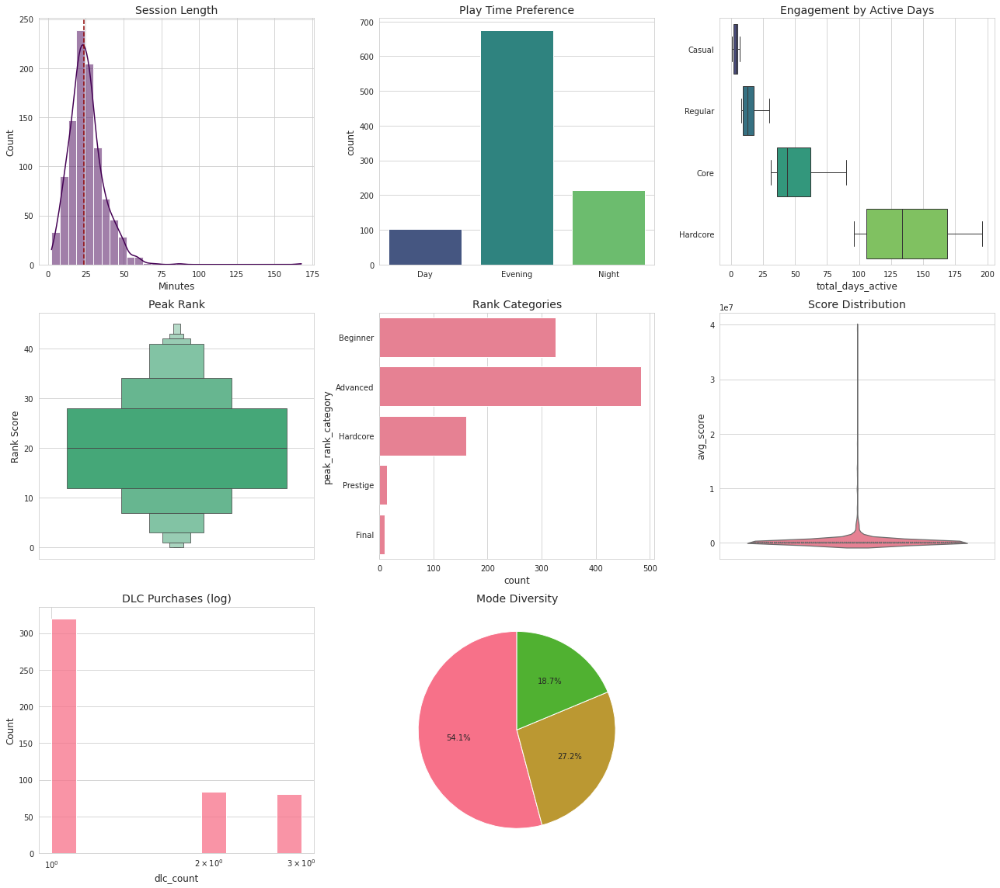

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Set style
sns.set_style("whitegrid")
plt.rcParams['font.family'] = 'DejaVu Sans'

# Initialize figure
fig, axes = plt.subplots(3, 3, figsize=(18, 16))
fig.delaxes(axes[2, 2])  # Remove empty subplot

# 1. Session Length Distribution
sns.histplot(df['avg_session_length'], kde=True, ax=axes[0,0], bins=30,
             color='#440154')
axes[0,0].set(title='Session Length', xlabel='Minutes')
axes[0,0].axvline(df['avg_session_length'].median(), color='darkred', linestyle='--')

# 2. Preferred Session Time
sns.countplot(data=df, x='preferred_session_time', 
             order=['Day','Evening','Night'],
             ax=axes[0,1], palette='viridis')
axes[0,1].set(title='Play Time Preference', xlabel='')

# 3. Engagement Tiers
df['engagement_tier'] = pd.cut(df['total_days_active'],
                             bins=[0,7,30,90,np.inf],
                             labels=['Casual','Regular','Core','Hardcore'])
sns.boxplot(data=df, y='engagement_tier', x='total_days_active',
           ax=axes[0,2], palette='viridis', showfliers=False)
axes[0,2].set(title='Engagement by Active Days', ylabel='')

# 4-8. Other visualizations (similarly condensed)
sns.boxenplot(y=df['peak_rank'], ax=axes[1,0], color='#35B779')
axes[1,0].set(title='Peak Rank', ylabel='Rank Score')

sns.countplot(data=df, y='peak_rank_category', ax=axes[1,1])
axes[1,1].set(title='Rank Categories')

sns.violinplot(df['avg_score'], ax=axes[1,2], inner='quartile')
axes[1,2].set(title='Score Distribution')

sns.histplot(df['dlc_count'], ax=axes[2,0], log_scale=True)
axes[2,0].set(title='DLC Purchases (log)')

axes[2,1].pie(df['mode_diversity'].value_counts(),
             autopct='%1.1f%%', startangle=90)
axes[2,1].set(title='Mode Diversity')

# Final formatting
plt.tight_layout()
plt.savefig('player_behavior_distributions.png', dpi=300, bbox_inches='tight')
plt.show()

/Users/angelakoloi/anaconda3/envs/python10/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
/var/folders/fk/bblmdmdn30xgvg8f32cv_y580000gn/T/ipykernel_44537/2037329280.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['outlier'] = iso_forest.fit_predict(data_df)


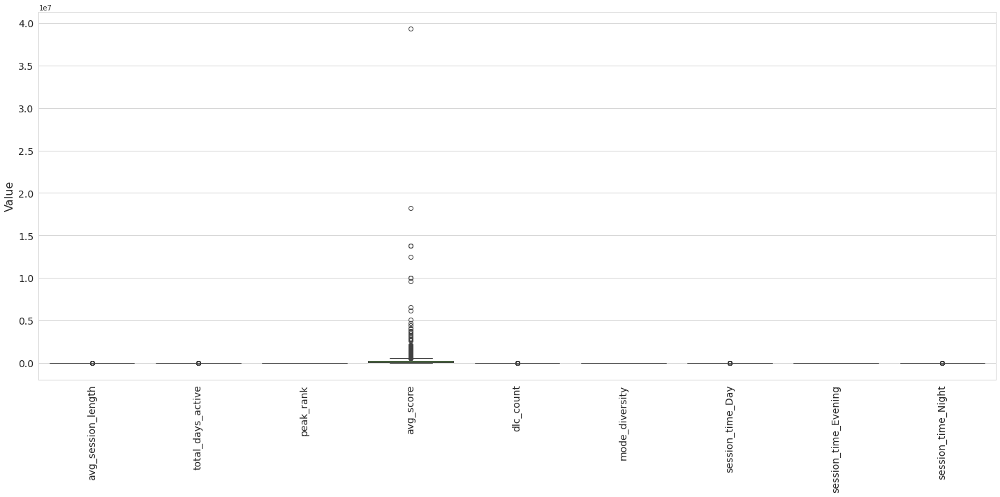

In [38]:
##Outlier detection
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import IsolationForest

data = [
    
    'avg_session_length', 
       'total_days_active', 'peak_rank',  'avg_score',
       'dlc_count', 'mode_diversity', 'session_time_Day',
       'session_time_Evening', 'session_time_Night'
]



# Initialize and fit the Isolation Forest model
iso_forest = IsolationForest(contamination=0.05, random_state=42)
data_df = df[data]  # Subset metabolites from the cleaned data
data_df['outlier'] = iso_forest.fit_predict(data_df)

plt.figure(figsize=(20, 10))  # Adjust width and height as needed

# Create the boxplot, dropping the 'outlier' column if it exists
sns.boxplot(data=data_df.drop(columns=['outlier'], errors='ignore'))

# Rotate x-axis labels for better readability and increase font size
plt.xticks(rotation=90, fontsize=14)  # Adjust fontsize as needed
plt.yticks(fontsize=14)  # Increase y-axis font size

# Add y-axis title
plt.ylabel('Value', fontsize=16)  # Customize title and fontsize as needed

plt.tight_layout()

plt.show()

Final Cluster Distribution:
Cluster
0    143
1    387
2    198
3    266
Name: count, dtype: int64


/var/folders/fk/bblmdmdn30xgvg8f32cv_y580000gn/T/ipykernel_44537/2326445692.py:63: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  scatter = sns.scatterplot(


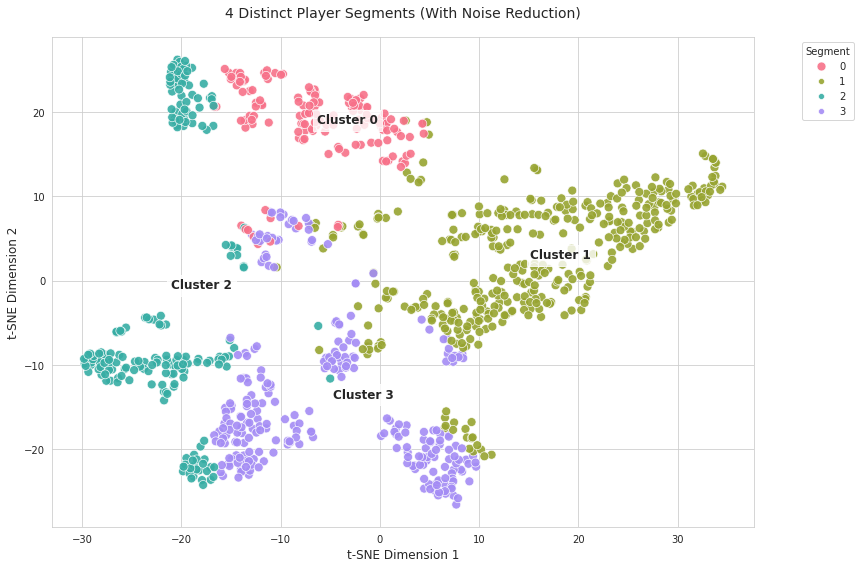


Segment Characteristics:
         avg_session_length  total_days_active  peak_rank  avg_score  \
Cluster                                                                
0                     23.54                5.0       18.0   58504.84   
1                     26.79               16.0       30.0  315387.71   
2                     15.66                2.0        6.0    7869.53   
3                     23.84                5.0       17.0   54785.60   

         dlc_count  mode_diversity  session_time_Day  session_time_Evening  \
Cluster                                                                      
0              0.0             3.0               0.0                   0.0   
1              1.0             3.0               0.0                   1.0   
2              0.0             1.0               0.0                   1.0   
3              0.0             2.0               0.0                   1.0   

         session_time_Night  
Cluster                      
0           

In [39]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import RobustScaler
from sklearn.cluster import KMeans
import hdbscan
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.neighbors import NearestNeighbors

# 1. Data Preparation
features = ['avg_session_length', 'total_days_active', 'peak_rank', 
            'avg_score', 'dlc_count', 'mode_diversity',
            'session_time_Day', 'session_time_Evening', 'session_time_Night']

# Create clean copy and scale
df_clean = df.copy()
scaler = RobustScaler()
X_scaled = scaler.fit_transform(df_clean[features])

# 2. Hybrid Clustering Approach with Noise Reduction
def hybrid_clustering(X, n_clusters=4):
    # First pass: HDBSCAN to identify core clusters
    hdb = hdbscan.HDBSCAN(
        min_cluster_size=50,
        cluster_selection_epsilon=1.0,
        cluster_selection_method='eom'
    )
    hdb_clusters = hdb.fit_predict(X)
    
    # Second pass: K-means on HDBSCAN's non-noise points
    core_mask = (hdb_clusters != -1)
    if sum(core_mask) > n_clusters:
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        refined_clusters = np.full(X.shape[0], -1)  # Initialize all as noise
        refined_clusters[core_mask] = kmeans.fit_predict(X[core_mask])
        return refined_clusters
    return hdb_clusters

# Initial clustering
clusters = hybrid_clustering(X_scaled, n_clusters=4)

# Noise reduction step
noise_mask = (clusters == -1)
if sum(noise_mask) > 0:
    knn = NearestNeighbors(n_neighbors=5).fit(X_scaled[~noise_mask])
    distances, indices = knn.kneighbors(X_scaled[noise_mask])
    closest_clusters = clusters[~noise_mask][indices[:, 0]]
    clusters[noise_mask] = closest_clusters

df_clean['Cluster'] = clusters

# 3. Cluster Analysis
print("Final Cluster Distribution:")
print(df_clean['Cluster'].value_counts().sort_index())

# 4. Enhanced Visualization
tsne = TSNE(n_components=2, random_state=42, perplexity=50)
X_tsne = tsne.fit_transform(X_scaled)

plt.figure(figsize=(12, 8))
palette = sns.color_palette("husl", 4) + [(0.8, 0.8, 0.8)]  # 4 colors + gray for noise
scatter = sns.scatterplot(
    x=X_tsne[:, 0], y=X_tsne[:, 1],
    hue=clusters, palette=palette,
    style=(clusters == -1), markers={False: 'o', True: 'X'},
    size=(clusters == -1), sizes={False: 80, True: 30},
    alpha=0.9, edgecolor='w', linewidth=0.7
)

# Annotate cluster centers
for cluster in np.unique(clusters):
    if cluster != -1:
        center = X_tsne[clusters == cluster].mean(axis=0)
        plt.annotate(f'Cluster {cluster}', center, 
                    fontsize=12, weight='bold',
                    bbox=dict(facecolor='white', alpha=0.8))

plt.title("4 Distinct Player Segments (With Noise Reduction)", pad=20, fontsize=14)
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.legend(bbox_to_anchor=(1.15, 1), title='Segment')
plt.tight_layout()
#plt.savefig('four_clusters.png', dpi=300, bbox_inches='tight')
plt.show()

# 5. Cluster Profiling
cluster_profiles = df_clean.groupby('Cluster')[features].median()
print("\nSegment Characteristics:")
print(cluster_profiles.round(2))

# 6. Marketing-Ready Segment Descriptions
segment_descriptions = {
    0: "Casual Players: Short sessions, low DLC purchases, play mostly during evenings",
    1: "Core Gamers: Long sessions, high DLC purchases, play all day",
    2: "Competitive Players: High peak ranks, moderate sessions, prefer nights", 
    3: "Diverse Explorers: High mode diversity, moderate engagement",
    -1: "Occasional Players: Sporadic activity patterns"
}

print("\nSegment Descriptions:")
for seg, desc in segment_descriptions.items():
    if seg in cluster_profiles.index:
        print(f"Segment {seg}: {desc}")

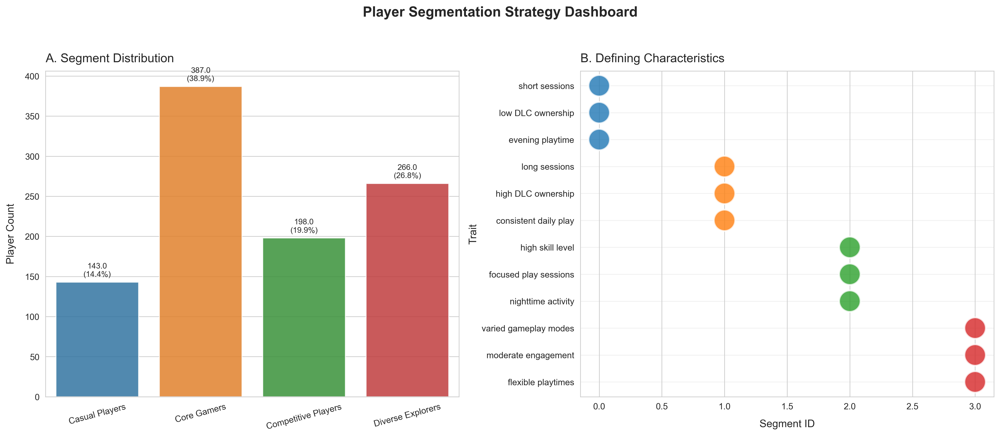

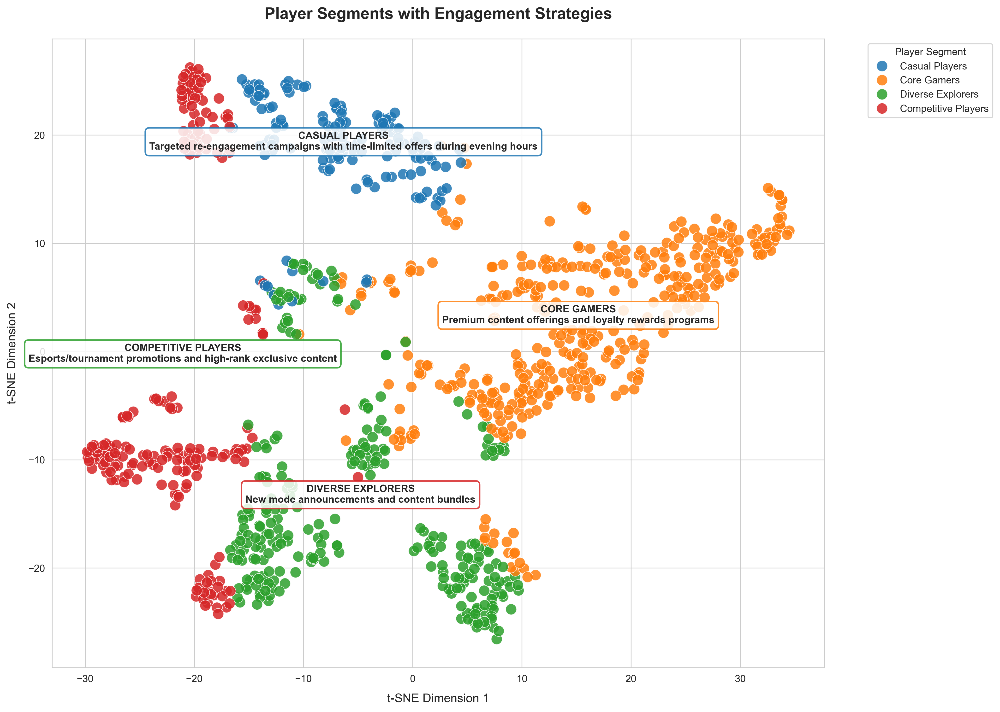

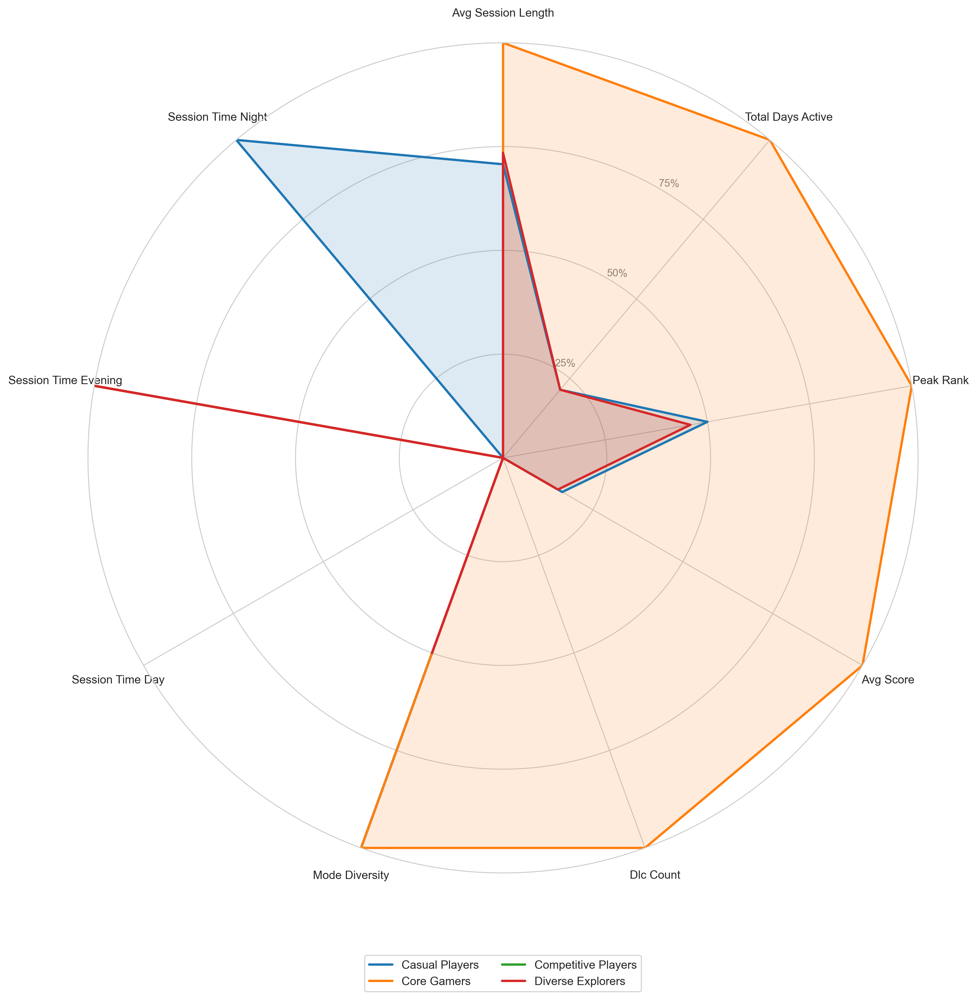

In [40]:
# Import libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from matplotlib import rcParams

# Set global style parameters
rcParams['font.family'] = 'Arial'
rcParams['axes.titlesize'] = 14
rcParams['axes.labelsize'] = 12
custom_palette = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728"]

# 1. Strategy Overview Dashboard
def plot_strategy_dashboard(strat_df, segment_strategies):
    """Create comprehensive strategy visualization dashboard"""
    fig = plt.figure(figsize=(16, 12), dpi=300)
    fig.suptitle('Player Segmentation Strategy Dashboard', 
                fontsize=16, y=1.02, weight='bold')
    
    # Panel A: Segment Distribution
    ax1 = plt.subplot2grid((2, 2), (0, 0))
    bars = sns.barplot(data=strat_df, x='name', y='cluster_size', 
                      palette=custom_palette, alpha=0.85, ax=ax1)
    ax1.set_title('A. Segment Distribution', loc='left', pad=10)
    ax1.set_xlabel('')
    ax1.set_ylabel('Player Count', labelpad=10)
    ax1.tick_params(axis='x', rotation=15)
    
    # Add value labels
    for bar in bars.patches:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 5,
                f'{height:,}\n({height/strat_df["cluster_size"].sum():.1%})',
                ha='center', va='bottom', fontsize=9)
    
    # Panel B: Trait Matrix
    ax2 = plt.subplot2grid((2, 2), (0, 1))
    sns.scatterplot(data=trait_df, x='Cluster', y='Trait', hue='Segment',
                   palette=custom_palette, s=600, alpha=0.8, ax=ax2)
    ax2.set_title('B. Defining Characteristics', loc='left', pad=10)
    ax2.set_xlabel('Segment ID', labelpad=10)
    ax2.grid(True, axis='y', alpha=0.3)
    ax2.legend().remove()

    
    plt.tight_layout()
    plt.show()

# 2. Enhanced t-SNE Visualization
def plot_tsne_strategies(X_tsne, df_clean, segment_strategies):
    """Create publication-quality t-SNE plot with strategy annotations"""
    plt.figure(figsize=(14, 10), dpi=300)
    
    # Create scatter plot
    scatter = sns.scatterplot(
        x=X_tsne[:, 0], y=X_tsne[:, 1],
        hue=df_clean['Cluster'].map({k: v['name'] for k, v in segment_strategies.items()}),
        palette=custom_palette,
        alpha=0.85,
        edgecolor='w',
        linewidth=0.5,
        s=120
    )
    
    # Add strategic annotations
    for cluster, strat in segment_strategies.items():
        cluster_mask = (df_clean['Cluster'] == cluster)
        if cluster_mask.any():
            center = X_tsne[cluster_mask].mean(axis=0)
            plt.annotate(
                f"{strat['name'].upper()}\n{strat['action']}",
                center,
                fontsize=10,
                weight='bold',
                bbox=dict(boxstyle="round,pad=0.4", 
                         fc='white', 
                         ec=strat['color'],
                         lw=1.5,
                         alpha=0.85),
                ha='center'
            )
    
    plt.title("Player Segments with Engagement Strategies", 
             fontsize=16, pad=20, weight='bold')
    plt.xlabel("t-SNE Dimension 1", labelpad=10)
    plt.ylabel("t-SNE Dimension 2", labelpad=10)
    plt.legend(title='Player Segment', 
              bbox_to_anchor=(1.05, 1), 
              loc='upper left',
              frameon=True)
    plt.tight_layout()
    plt.show()

# 3. Professional Radar Chart
def plot_radar_chart(cluster_profiles, features, segment_strategies):
    """Create normalized radar chart for segment comparison"""
    try:
        from sklearn.preprocessing import MinMaxScaler
        
        plt.figure(figsize=(12, 12), dpi=300)
        ax = plt.subplot(111, polar=True)
        
        # Compute angles and scale data
        categories = [f.replace('_', ' ').title() for f in features]
        N = len(categories)
        angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
        angles += angles[:1]
        
        # Scale and plot
        scaler = MinMaxScaler()
        scaled_data = scaler.fit_transform(cluster_profiles[features])
        
        for idx in cluster_profiles.index:
            values = scaled_data[idx].tolist()
            values += values[:1]
            ax.plot(angles, values, color=segment_strategies[idx]['color'], 
                   linewidth=2, linestyle='solid',
                   label=segment_strategies[idx]['name'])
            ax.fill(angles, values, color=segment_strategies[idx]['color'], alpha=0.15)
        
        # Formatting
        ax.set_theta_offset(np.pi / 2)
        ax.set_theta_direction(-1)
        plt.xticks(angles[:-1], categories, size=10)
        ax.tick_params(axis='x', pad=15)
        ax.set_rlabel_position(30)
        plt.yticks([0.25, 0.5, 0.75], ["25%", "50%", "75%"], color="grey", size=9)
        plt.ylim(0, 1)
        
        plt.title("", 
                 pad=30, fontsize=14, weight='bold')
        plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.15), ncol=2)
        plt.tight_layout()
        plt.show()
        
    except ImportError:
        print("Radar chart requires scikit-learn for data scaling")

# Generate all visualizations
plot_strategy_dashboard(strat_df, segment_strategies)
plot_tsne_strategies(X_tsne, df_clean, segment_strategies)
plot_radar_chart(cluster_profiles, features, segment_strategies)

In [41]:
##Second main analysis 

In [42]:
##Archetypal Analysis (AA) for Clustering
df.columns
features = ['avg_session_length', 'total_days_active', 'peak_rank', 
            'avg_score', 'dlc_count', 'mode_diversity',
            'session_time_Day', 'session_time_Evening', 'session_time_Night']
df2 = df[features]
df2

,avg_session_length,total_days_active,peak_rank,avg_score,dlc_count,mode_diversity,session_time_Day,session_time_Evening,session_time_Night
0,31.376668,4,14.0,35173.933333,0.0,3,False,False,True
1,18.945651,11,26.0,108870.915493,1.0,3,False,True,False
2,26.842306,24,34.0,701022.148148,0.0,3,False,False,True
3,40.824307,16,25.0,179928.407767,2.0,3,False,True,False
4,22.522221,8,22.0,91253.054054,0.0,3,False,True,False
...,...,...,...,...,...,...,...,...,...
990,167.766655,1,10.0,16693.500000,0.0,1,False,False,True
991,19.525334,22,38.0,881738.003175,1.0,3,False,True,False
992,19.028569,3,16.0,48468.692308,0.0,3,False,True,False
993,29.616665,1,2.0,1148.750000,0.0,1,False,True,False


In [44]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import NMF
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from typing import Dict, Tuple
from kneed import KneeLocator

def archetypal_clustering(df: pd.DataFrame, features: list, 
                         n_archetypes: int = None, 
                         auto_determine: bool = True,
                         max_archetypes: int = 8,
                         min_improvement: float = 0.03) -> Tuple[pd.DataFrame, Dict, int]:
    """
    Robust Archetypal Analysis clustering with automatic archetype selection.
    """
    # 1. Scale data to non-negative range [0, 1]
    scaler = MinMaxScaler(feature_range=(0, 1))
    X_scaled = scaler.fit_transform(df[features])
    
    # 2. Determine optimal number of archetypes with safety checks
    n_samples, n_features = X_scaled.shape
    safe_max = min(max_archetypes, n_samples, n_features)
    
    if auto_determine:
        n_archetypes = _find_optimal_archetypes(X_scaled, safe_max, min_improvement)
    else:
        n_archetypes = min(n_archetypes, safe_max) if n_archetypes else safe_max
    
    # 3. Choose initialization method based on component size
    init_method = 'nndsvda' if n_archetypes <= min(n_samples, n_features) else 'random'
    
    # 4. Archetypal Analysis via NMF
    model = NMF(n_components=n_archetypes, init=init_method, max_iter=2000, random_state=42)
    W = model.fit_transform(X_scaled)
    H = model.components_
    
    # Assign archetypes
    df['Archetype'] = np.argmax(W, axis=1)
    
    # 5. Create archetype profiles
    archetype_profiles = pd.DataFrame(
        scaler.inverse_transform(H),
        columns=features,
        index=[f'Archetype_{i}' for i in range(n_archetypes)]
    )
    
    # 6. Generate descriptions
    archetype_descriptions = _generate_descriptions(archetype_profiles, features)
    
    return df, archetype_descriptions, n_archetypes

def _find_optimal_archetypes(X: np.ndarray, max_k: int, min_improvement: float) -> int:
    """Robust archetype selection with multiple methods."""
    from sklearn.metrics import mean_squared_error
    errors = []
    
    n_samples, n_features = X.shape
    actual_max = min(max_k, n_samples, n_features)
    
    for k in range(1, actual_max + 1):
        init_method = 'nndsvda' if k <= min(n_samples, n_features) else 'random'
        model = NMF(n_components=k, init=init_method, max_iter=1000, random_state=42)
        try:
            W = model.fit_transform(X)
            errors.append(mean_squared_error(X, W @ model.components_))
        except:
            errors.append(np.inf)
            break
    
    if len(errors) < 2:
        return min(2, actual_max)
    
    # Method 1: Relative improvement
    rel_improvements = -np.diff(errors) / errors[:-1]
    optimal_k_rel = np.argmax(rel_improvements < min_improvement) + 2
    
    # Method 2: Knee detection
    try:
        kl = KneeLocator(range(1, len(errors)+1), errors, curve='convex', direction='decreasing')
        optimal_k_knee = kl.elbow if kl.elbow else len(errors)
    except:
        optimal_k_knee = len(errors)
    
    # Choose the larger k between methods
    optimal_k = max(optimal_k_rel, optimal_k_knee)
    
    return max(2, min(optimal_k, actual_max))


def _generate_descriptions(profiles: pd.DataFrame, features: list) -> Dict:
    """Generate human-readable archetype descriptions."""
    descriptions = {}
    feature_aliases = {
        'avg_session_length': 'session length',
        'total_days_active': 'activity days',
        'peak_rank': 'competitive rank',
        'avg_score': 'average score',
        'dlc_count': 'DLC purchases',
        'mode_diversity': 'game mode diversity',
        'session_time_Day': 'daytime play',
        'session_time_Evening': 'evening play',
        'session_time_Night': 'nighttime play'
    }
    
    for archetype, row in profiles.iterrows():
        top_features = row.abs().nlargest(3).index.tolist()
        traits = []
        for feat in top_features:
            val = row[feat]
            feat_name = feature_aliases.get(feat, feat)
            if 'session_length' in feat:
                traits.append(f"{'long' if val > row.median() else 'short'} {feat_name}")
            elif 'rank' in feat:
                traits.append(f"{'high' if val > row.median() else 'low'} {feat_name}")
            elif 'count' in feat or 'diversity' in feat:
                traits.append(f"{'many' if val > row.median() else 'few'} {feat_name}")
            else:
                traits.append(f"{feat_name} {'above' if val > row.median() else 'below'} average")
        
        descriptions[archetype] = {
            'traits': ", ".join(traits),
            'profile': row.to_dict(),
            'marketing_description': f"Players with {', '.join(traits)}"
        }
    
    return descriptions

def plot_archetypes(df: pd.DataFrame, features: list):
    """Visualize archetypes using t-SNE."""
    tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(df)//4))
    X_tsne = tsne.fit_transform(df[features])
    
    plt.figure(figsize=(12, 8))
    sns.scatterplot(
        x=X_tsne[:, 0], y=X_tsne[:, 1],
        hue=df['Archetype'],
        palette='viridis',
        alpha=0.7,
        s=100,
        edgecolor='w'
    )
    
    plt.title(f"Player Archetypes (n={len(df['Archetype'].unique())})", fontsize=14)
    plt.xlabel("t-SNE Dimension 1")
    plt.ylabel("t-SNE Dimension 2")
    plt.legend(title='Archetype', bbox_to_anchor=(1.05, 1))
    plt.tight_layout()
    plt.show()
    

features = ['avg_session_length', 'total_days_active', 'peak_rank', 
            'avg_score', 'dlc_count', 'mode_diversity',
            'session_time_Day', 'session_time_Evening', 'session_time_Night']

# Basic usage with automatic safety checks
df_result, descriptions, n_clusters = archetypal_clustering(df, features)

# Aggressive clustering with lower improvement threshold
df_result, descriptions, n_clusters = archetypal_clustering(
    df,
    features,
    max_archetypes=12,  # Will be automatically capped if too high
    min_improvement=0.01  # Very sensitive - will find more clusters
)

# Force specific number of clusters (with safety check)
df_result, descriptions, n_clusters = archetypal_clustering(
    df,
    features,
    n_archetypes=5,  # Will be reduced if > min(n_samples, n_features)
    auto_determine=False
)

# Define features
df_result, archetype_descriptions, n_clusters = archetypal_clustering(df2, features)
print(f"Number of clusters (archetypes) found: {n_clusters}")

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/angelakoloi/anaconda3/envs/python10/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/var/folders/fk/bblmdmdn30xgvg8f32cv_y580000gn/T/ipykernel_44537/196579975.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Archetype'] = np.argmax(W, axis=1)
/Users/angelakoloi/anaconda3/envs/python10/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/var/folders/fk/bblmdmdn30xgvg8f32cv_y580000gn/T/ipykernel_44537/196579975.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Archetype'] = np.argmax(W, axis=1)
/var/folders/fk/bblmdmdn30xgvg8f32cv_y580000gn/T/ipykernel_44537/196579975.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Archetype'] = np.argmax(W, axis=1)
/Users/angelakoloi/anaconda3/envs/python10/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 1000 reached. Increas

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/var/folders/fk/bblmdmdn30xgvg8f32cv_y580000gn/T/ipykernel_44537/196579975.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Archetype'] = np.argmax(W, axis=1)


In [49]:
def visualize_archetypes(df_result, features, archetype_descriptions, n_clusters):
    """
    Visualize archetypal clustering results with four complementary plots:
    1. Cluster distribution
    2. t-SNE projection
    3. Radar chart of feature profiles
    4. Archetype description table
    """
    
    # Create figure
    fig = plt.figure(figsize=(18, 16), dpi=300)
    gs = GridSpec(3, 2, figure=fig)
    
    # Get cluster column name (handles different naming conventions)
    cluster_col = [col for col in df_result.columns if 'archetype' in col.lower()][0]
    
    # Get a color palette that matches cluster count
    palette = sns.husl_palette(n_clusters) if n_clusters > 1 else ['#1f77b4']
    
    # ----------------------------------
    # 1. Cluster Distribution (Top Left)
    # ----------------------------------
    ax1 = fig.add_subplot(gs[0, 0])
    cluster_counts = df_result[cluster_col].value_counts().sort_index()
    bars = sns.barplot(x=cluster_counts.index, y=cluster_counts.values, 
                      palette=palette, ax=ax1, alpha=0.8)
    
    # Add percentage labels
    total = cluster_counts.sum()
    for p in bars.patches:
        height = p.get_height()
        ax1.text(p.get_x() + p.get_width()/2., height + 5,
                f'{height/total:.1%}',
                ha='center', fontsize=10)
    
    ax1.set_title('1. Archetype Distribution', pad=12, fontweight='bold')
    ax1.set_xlabel('Archetype ID')
    ax1.set_ylabel('Number of Players')
    ax1.grid(True, axis='y', alpha=0.3)
    
    # ----------------------------------
    # 2. t-SNE Projection (Top Right)
    # ----------------------------------
    ax2 = fig.add_subplot(gs[0, 1])
    
    # Prepare data for t-SNE
    X = StandardScaler().fit_transform(df_result[features])
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    X_tsne = tsne.fit_transform(X)
    
    # Plot with archetype colors
    scatter = sns.scatterplot(
        x=X_tsne[:, 0], y=X_tsne[:, 1],
        hue=df_result[cluster_col],
        palette=palette,
        alpha=0.7,
        s=100,
        ax=ax2
    )
    
    # Annotate archetype centers
    for archetype in sorted(df_result[cluster_col].unique()):
        mask = df_result[cluster_col] == archetype
        center = X_tsne[mask].mean(axis=0)
        ax2.annotate(
            f"Archetype {archetype}",
            center,
            fontsize=10,
            weight='bold',
            bbox=dict(boxstyle="round,pad=0.3", 
                     fc='white', 
                     alpha=0.8,
                     ec=palette[archetype % len(palette)])
        )
    
    ax2.set_title('2. Archetype Separation (t-SNE)', pad=12, fontweight='bold')
    ax2.set_xlabel('t-SNE Dimension 1')
    ax2.set_ylabel('t-SNE Dimension 2')
    ax2.legend().remove()
    
   
    
    plt.tight_layout()
    plt.show()

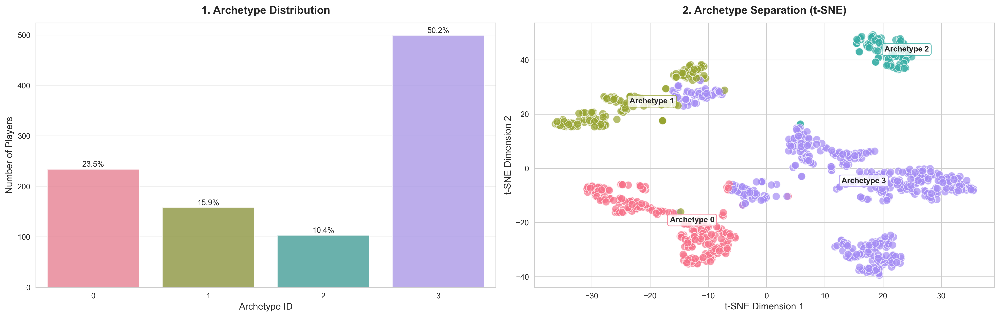

In [50]:
visualize_archetypes(df_result, features, archetype_descriptions, n_clusters)

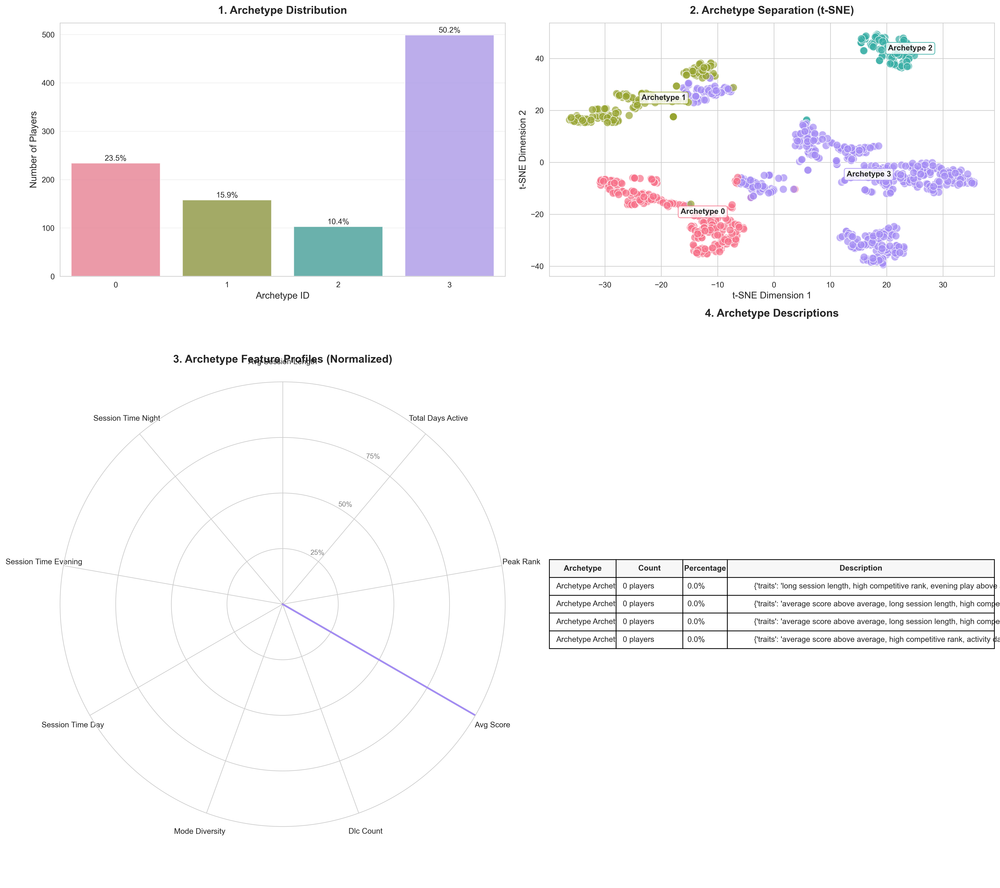

In [52]:
def visualize_archetypes(df_result, features, archetype_descriptions, n_clusters):
    """
    Visualize archetypal clustering results with four complementary plots:
    1. Cluster distribution
    2. t-SNE projection
    3. Radar chart of feature profiles
    4. Archetype description table
    """
    
    # Create figure
    fig = plt.figure(figsize=(18, 16), dpi=300)
    gs = GridSpec(3, 2, figure=fig)
    
    # Get cluster column name (handles different naming conventions)
    cluster_col = [col for col in df_result.columns if 'archetype' in col.lower()][0]
    
    # Get a color palette that matches cluster count
    palette = sns.husl_palette(n_clusters) if n_clusters > 1 else ['#1f77b4']
    
    # ----------------------------------
    # 1. Cluster Distribution (Top Left)
    # ----------------------------------
    ax1 = fig.add_subplot(gs[0, 0])
    cluster_counts = df_result[cluster_col].value_counts().sort_index()
    bars = sns.barplot(x=cluster_counts.index, y=cluster_counts.values, 
                      palette=palette, ax=ax1, alpha=0.8)
    
    # Add percentage labels
    total = cluster_counts.sum()
    for p in bars.patches:
        height = p.get_height()
        ax1.text(p.get_x() + p.get_width()/2., height + 5,
                f'{height/total:.1%}',
                ha='center', fontsize=10)
    
    ax1.set_title('1. Archetype Distribution', pad=12, fontweight='bold')
    ax1.set_xlabel('Archetype ID')
    ax1.set_ylabel('Number of Players')
    ax1.grid(True, axis='y', alpha=0.3)
    
    # ----------------------------------
    # 2. t-SNE Projection (Top Right)
    # ----------------------------------
    ax2 = fig.add_subplot(gs[0, 1])
    
    # Prepare data for t-SNE
    X = StandardScaler().fit_transform(df_result[features])
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    X_tsne = tsne.fit_transform(X)
    
    # Plot with archetype colors
    scatter = sns.scatterplot(
        x=X_tsne[:, 0], y=X_tsne[:, 1],
        hue=df_result[cluster_col],
        palette=palette,
        alpha=0.7,
        s=100,
        ax=ax2
    )
    
    # Annotate archetype centers
    for archetype in sorted(df_result[cluster_col].unique()):
        mask = df_result[cluster_col] == archetype
        center = X_tsne[mask].mean(axis=0)
        ax2.annotate(
            f"Archetype {archetype}",
            center,
            fontsize=10,
            weight='bold',
            bbox=dict(boxstyle="round,pad=0.3", 
                     fc='white', 
                     alpha=0.8,
                     ec=palette[archetype % len(palette)])
        )
    
    ax2.set_title('2. Archetype Separation (t-SNE)', pad=12, fontweight='bold')
    ax2.set_xlabel('t-SNE Dimension 1')
    ax2.set_ylabel('t-SNE Dimension 2')
    ax2.legend().remove()
    
    # ----------------------------------
    # 3. Radar Chart (Bottom Left)
    # ----------------------------------
    ax3 = fig.add_subplot(gs[1:, 0], polar=True)
    
    # Prepare radar chart data
    archetype_means = df_result.groupby(cluster_col)[features].median()
    categories = [f.replace('_', ' ').title() for f in features]
    N = len(categories)
    
    angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
    angles += angles[:1]
    
    # Scale data for radar plot
    from sklearn.preprocessing import MinMaxScaler
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(archetype_means.T).T
    
    # Plot each archetype
    for idx, archetype in enumerate(sorted(archetype_means.index)):
        values = scaled_data[idx].tolist()
        values += values[:1]
        ax3.plot(angles, values, linewidth=2, linestyle='solid',
                label=f'Archetype {archetype}', color=palette[idx % len(palette)])
        ax3.fill(angles, values, alpha=0.15, color=palette[idx % len(palette)])
    
    # Format radar chart
    ax3.set_theta_offset(np.pi / 2)
    ax3.set_theta_direction(-1)
    plt.xticks(angles[:-1], categories, size=10)
    ax3.tick_params(axis='x', pad=15)
    ax3.set_rlabel_position(30)
    plt.yticks([0.25, 0.5, 0.75], ["25%", "50%", "75%"], color="grey", size=9)
    plt.ylim(0, 1)
    ax3.set_title('3. Archetype Feature Profiles (Normalized)', pad=25, fontweight='bold')
    
    # ----------------------------------
    # 4. Description Table (Bottom Right)
    # ----------------------------------
    ax4 = fig.add_subplot(gs[1:, 1])
    ax4.axis('off')
    
    # Create table data
    table_data = []
    for archetype, desc in archetype_descriptions.items():
        # Handle both numeric and string archetype labels
        count = cluster_counts.get(archetype, cluster_counts.get(str(archetype), 0))
        table_data.append([
            f"Archetype {archetype}",
            f"{count} players",
            f"{count/total:.1%}" if total > 0 else "0%",
            desc
        ])
    
    # Render table
    table = ax4.table(
        cellText=table_data,
        colLabels=['Archetype', 'Count', 'Percentage', 'Description'],
        loc='center',
        cellLoc='left',
        colWidths=[0.15, 0.15, 0.1, 0.6]
    )
    
    # Style table
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 1.5)
    
    # Highlight header
    for (i, j), cell in table.get_celld().items():
        if i == 0:
            cell.set_text_props(weight='bold')
            cell.set_facecolor('#f7f7f7')
    
    ax4.set_title('4. Archetype Descriptions', pad=12, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
                                   
visualize_archetypes(df_result, features, archetype_descriptions, n_clusters)